In [419]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import pymysql
import datetime as dt
from dateutil.relativedelta import relativedelta

In [373]:
plt.style.use('seaborn')
plt.rc("font", family='Malgun Gothic')
plt.rc('axes', unicode_minus = False)

In [186]:
conn = pymysql.connect(
    host='mudatabase.cr4neufosdwe.ap-northeast-2.rds.amazonaws.com', user='mu', password="munanodb",
    charset='utf8', db='mudatabase', port = 3306 )

In [5]:
cur = conn.cursor()

sql = "select date_format(a.date, '%Y-%m') as date, a.gu, a.dong, a.area, a.floor, a.built, a.doro, a.tradetype, a.price, b.interest, b.growth, b.unemployment, b.inflation, b.stock, b.house_debit, b.ex_dallar, b.ex_yen, c.household," 
sql += "c.pop, c.male_kor, c.female_kor, c.male_for, c.female_for, c.perhold, c.senior from sell_re as a, eco_macro as b, population as c" 
sql += "where date_format(a.date, '%Y-%m') = date_format(b.date, '%Y-%m') and date_format(a.date, '%Y-%m') = date_format(c.date, '%Y-%m') and a.dong = c.dong;"

cur.execute(sql)
sell = pd.DataFrame(cur.fetchall())

In [9]:
sell.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 346791 entries, 0 to 346790
Data columns (total 25 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   0       346791 non-null  object 
 1   1       346791 non-null  object 
 2   2       346791 non-null  object 
 3   3       346791 non-null  float64
 4   4       346791 non-null  int64  
 5   5       346791 non-null  int64  
 6   6       346791 non-null  object 
 7   7       346791 non-null  object 
 8   8       346791 non-null  int64  
 9   9       346791 non-null  float64
 10  10      346791 non-null  float64
 11  11      346791 non-null  float64
 12  12      346791 non-null  float64
 13  13      346791 non-null  float64
 14  14      346791 non-null  float64
 15  15      346791 non-null  float64
 16  16      346791 non-null  float64
 17  17      346791 non-null  int64  
 18  18      346791 non-null  int64  
 19  19      346791 non-null  int64  
 20  20      346791 non-null  int64  
 21  21      34

In [64]:
dt.datetime.strptime(sell['date'][0], '%Y-%m')

datetime.datetime(2016, 1, 1, 0, 0)

In [10]:
sell.columns = ['date', 'gu','dong','area','floor','built','doro', 'tradetype', 'price', 'interest', 'growth', 'unemployment', 'inflation', 'stock', 'house_debit', 'ex_dallar', 'ex_yen', 'household',
               'pop', 'male_kor', 'female_kor', 'male_for', 'female_for','perhold', 'senior']

In [11]:
sell

,date,gu,dong,area,floor,built,doro,tradetype,price,interest,...,ex_dallar,ex_yen,household,pop,male_kor,female_kor,male_for,female_for,perhold,senior
0,2016-01,강남구,논현1동,33.54,13,2003,도산대로 158,4,23700,1.5,...,1201.67,1017.44,14471,25235,11401,13291,258,285,1.71,2507
1,2016-01,강남구,논현1동,64.78,3,1991,봉은사로 129,4,28300,1.5,...,1201.67,1017.44,14471,25235,11401,13291,258,285,1.71,2507
2,2016-01,강남구,개포4동,28.30,-1,1997,개포로15길 30,1,8000,1.5,...,1201.67,1017.44,8480,20432,10013,10237,80,102,2.39,1898
3,2016-01,강남구,논현1동,75.85,2,2001,학동로23길 59,1,48800,1.5,...,1201.67,1017.44,14471,25235,11401,13291,258,285,1.71,2507
4,2016-01,강남구,도곡2동,16.98,5,2012,논현로26길 36-5,1,14000,1.5,...,1201.67,1017.44,12072,35246,16368,18738,76,64,2.91,3576
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346786,2021-06,구로구,수궁동,36.16,4,2011,부일로1길 116-1,1,23000,0.5,...,1121.30,1018.50,10010,24021,11690,12034,153,144,2.37,4351
346787,2021-06,성동구,금호2.3가동,33.88,5,2012,금호산8길 2-7,1,30000,0.5,...,1121.30,1018.50,10110,23047,10905,11975,69,98,2.26,3818
346788,2021-06,구로구,수궁동,61.43,-1,1993,오리로21가길 37,1,16000,0.5,...,1121.30,1018.50,10010,24021,11690,12034,153,144,2.37,4351
346789,2021-06,구로구,수궁동,74.26,5,2002,오리로17길 85-3,1,20800,0.5,...,1121.30,1018.50,10010,24021,11690,12034,153,144,2.37,4351


## 면적 eda

(0.0, 100.0)

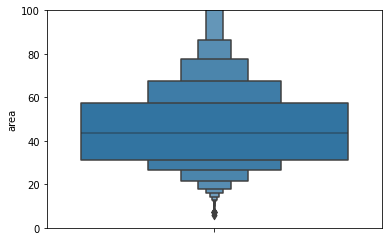

In [41]:
sns.boxenplot(y = sell['area'])
plt.ylim(0,100)

TypeError: 'tuple' object is not callable

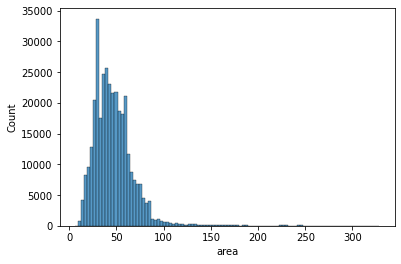

In [227]:
sns.histplot(data = sell, x='area', bins=100, )

In [229]:
sell['area_level'] = sell['area'].apply(lambda x : 1 if x < 34 else (2 if x < 68 else (3 if x < 100 else 4)))

In [209]:
sell['area'].quantile(q = .98)

97.79

<Figure size 720x720 with 0 Axes>

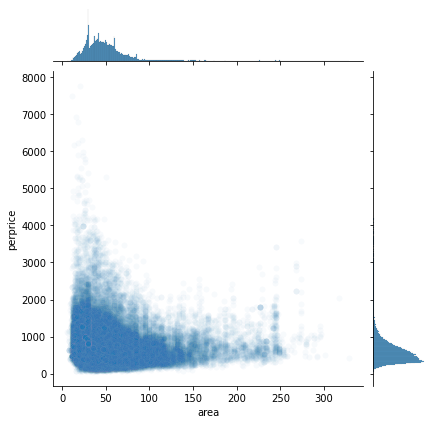

In [228]:
plt.figure(figsize = [10,10])
sns.jointplot(data = sell, x='area',y='perprice', alpha=0.03)

In [83]:
sell['perprice'] = sell['price']/sell['area']

(0.0, 2000.0)

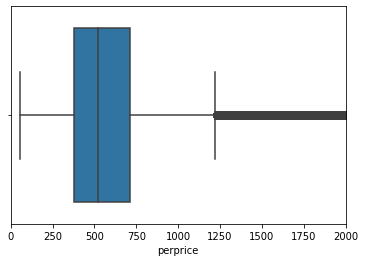

In [85]:
sns.boxplot(x = sell['perprice'])
plt.xlim(0,2000)

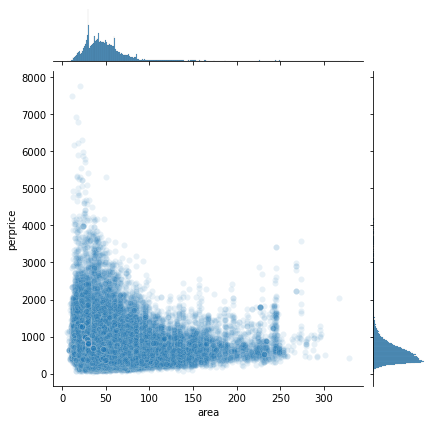

In [88]:
sns.jointplot(data = sell, x = 'area',y='perprice', alpha = 0.1)

In [189]:
sell[sell['perprice'] > 5000]

,date,gu,dong,area,floor,built,doro,tradetype,price,interest,...,pop,male_kor,female_kor,male_for,female_for,perhold,senior,building_year,perprice,cityrange
48615,2021-03,용산구,한남동,29.58,1,1974,대사관로34나길 8,1,160000,0.50,...,23351,10011,10767,1466,1107,1.86000,3696,47,5409.060176,3
62931,2021-06,동작구,상도2동,50.38,2,1976,상도로24길 22-8,1,268000,0.50,...,29367,14009,15094,93,171,2.24000,4479,45,5319.571258,3
71717,2021-04,용산구,한남동,28.91,-1,1997,대사관로30나길 26-6,1,147000,0.50,...,23157,9966,10658,1435,1098,1.86000,3684,24,5084.745763,3
90751,2019-12,용산구,한남동,22.74,1,1991,대사관로34길 46-3,1,115000,1.25,...,23704,9960,10674,1776,1294,1.86000,3590,28,5057.167986,3
91454,2021-05,서초구,방배3동,21.60,2,1996,효령로20나길 13-6,1,120000,0.50,...,19381,9326,9953,49,53,2.56000,3492,25,5555.555556,3
113177,2020-07,성동구,성수1가1동,20.56,4,2006,성덕정길 63-26,1,109000,0.50,...,16954,8316,8324,178,136,2.18373,2177,14,5301.556420,3
113237,2020-07,성동구,성수1가1동,17.67,2,2006,둘레7길 5,1,120000,0.50,...,16954,8316,8324,178,136,2.18373,2177,14,6791.171477,3
119129,2021-03,중구,청구동,13.95,6,2004,청구로 69,4,86000,0.50,...,14109,6587,7307,103,112,2.18000,2731,17,6164.874552,2
140005,2020-12,용산구,보광동,23.01,-1,1992,우사단로10길 174-5,1,120000,0.50,...,15531,7039,7177,880,435,1.83000,2817,28,5215.123859,3
147930,2020-09,용산구,한남동,18.63,-1,1991,장문로49길 66,1,116000,0.50,...,23969,10255,11035,1522,1157,1.86476,3794,29,6226.516371,3


In [172]:
sell.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 346791 entries, 0 to 346790
Data columns (total 28 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   date           346791 non-null  object 
 1   gu             346791 non-null  object 
 2   dong           346791 non-null  object 
 3   area           346791 non-null  float64
 4   floor          346791 non-null  int64  
 5   built          346791 non-null  int64  
 6   doro           346791 non-null  object 
 7   tradetype      346791 non-null  object 
 8   price          346791 non-null  int64  
 9   interest       346791 non-null  float64
 10  growth         346791 non-null  float64
 11  unemployment   346791 non-null  float64
 12  inflation      346791 non-null  float64
 13  stock          346791 non-null  float64
 14  house_debit    346791 non-null  float64
 15  ex_dallar      346791 non-null  float64
 16  ex_yen         346791 non-null  float64
 17  household      346791 non-nul

In [178]:
sell.index

RangeIndex(start=0, stop=346791, step=1)

In [187]:
cur = conn.cursor()

sql = "select date_format(date, '%Y-%m') as date, inflation from eco_macro" 

cur.execute(sql)
inflation = pd.DataFrame(cur.fetchall())

<AxesSubplot:>

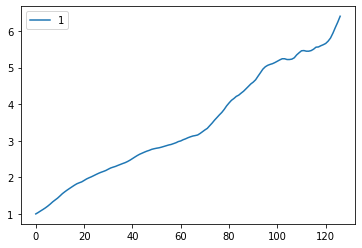

In [188]:
inflation.plot()

In [300]:
sell[sell['area_level']==4]

,date,gu,dong,area,floor,built,doro,tradetype,price,interest,...,male_kor,female_kor,male_for,female_for,perhold,senior,building_year,perprice,cityrange,area_level
15,2016-01,강남구,도곡2동,128.43,7,2004,언주로30길 26,4,120500,1.50,...,16368,18738,76,64,2.91,3576,12,938.254302,3,4
44,2016-01,강남구,논현2동,209.43,5,2005,언주로 626,4,147000,1.50,...,10636,12075,158,136,2.05,2621,11,701.905171,2,4
73,2016-01,동작구,상도1동,167.04,3,1997,매봉로2길 10,1,77000,1.50,...,23378,23985,594,690,2.25,5760,19,460.967433,3,4
90,2016-02,강동구,둔촌2동,156.11,2,1997,천호대로200길 81,1,57115,1.50,...,14254,14547,68,69,2.68,3200,19,365.863814,3,4
217,2016-06,송파구,방이1동,115.70,5,2002,가락로42길 15-6,1,42500,1.25,...,7923,8295,71,63,2.73,1628,14,367.329300,3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346164,2020-11,서초구,반포4동,153.39,3,1994,동광로32길 7,1,208000,0.50,...,9171,10219,316,271,2.66,2831,26,1356.020601,3,4
346167,2020-11,서초구,반포4동,233.94,4,1992,동광로 141,1,203000,0.50,...,9171,10219,316,271,2.66,2831,28,867.743866,2,4
346179,2020-12,양천구,목1동,113.00,12,2004,목동서로 221,4,140000,0.50,...,15167,16414,78,68,2.99,3122,16,1238.938053,2,4
346217,2020-12,양천구,목1동,103.71,19,2004,목동서로 155,4,169500,0.50,...,15167,16414,78,68,2.99,3122,16,1634.365056,2,4


In [283]:
sell['area'].quantile(q = 0.20)

29.69

In [297]:
def area_leveling(x) :
    if x < 33.3 :
        return 1
#     elif x < 49.5 :
#         return 2
    elif x < 66.6 :
        return 2
#     elif x < 82.6 :
#         return 4
    elif x < 99.9 :
        return 3
    else :
        return 4

In [306]:
sell['year'] = sell['date'].apply(lambda x : int(x[:4]))

In [321]:
sell['area_level'] = sell['area'].map(area_leveling)
a = sell.groupby(['year','gu','dong','area_level']).agg({'perprice' : 'mean'})
a = a.reset_index()

In [317]:
sell

,date,gu,dong,area,floor,built,doro,tradetype,price,interest,...,female_kor,male_for,female_for,perhold,senior,building_year,perprice,cityrange,area_level,year
0,2016-01,강남구,논현1동,33.54,13,2003,도산대로 158,4,23700,1.5,...,13291,258,285,1.71,2507,13,706.618962,1,2,2016
1,2016-01,강남구,논현1동,64.78,3,1991,봉은사로 129,4,28300,1.5,...,13291,258,285,1.71,2507,25,436.863229,2,2,2016
2,2016-01,강남구,개포4동,28.30,-1,1997,개포로15길 30,1,8000,1.5,...,10237,80,102,2.39,1898,19,282.685512,3,1,2016
3,2016-01,강남구,논현1동,75.85,2,2001,학동로23길 59,1,48800,1.5,...,13291,258,285,1.71,2507,15,643.375082,3,3,2016
4,2016-01,강남구,도곡2동,16.98,5,2012,논현로26길 36-5,1,14000,1.5,...,18738,76,64,2.91,3576,4,824.499411,3,1,2016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346786,2021-06,구로구,수궁동,36.16,4,2011,부일로1길 116-1,1,23000,0.5,...,12034,153,144,2.37,4351,10,636.061947,3,2,2021
346787,2021-06,성동구,금호2.3가동,33.88,5,2012,금호산8길 2-7,1,30000,0.5,...,11975,69,98,2.26,3818,9,885.478158,3,2,2021
346788,2021-06,구로구,수궁동,61.43,-1,1993,오리로21가길 37,1,16000,0.5,...,12034,153,144,2.37,4351,28,260.459059,3,2,2021
346789,2021-06,구로구,수궁동,74.26,5,2002,오리로17길 85-3,1,20800,0.5,...,12034,153,144,2.37,4351,19,280.096957,3,3,2021


<AxesSubplot:xlabel='year', ylabel='perprice'>

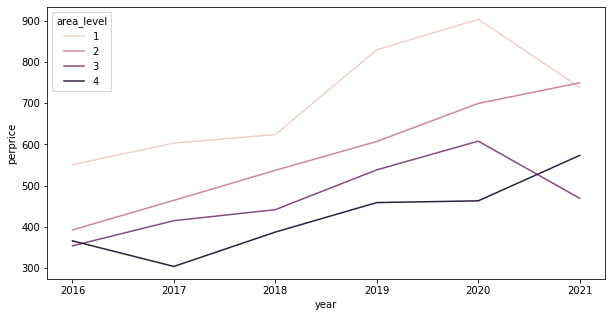

In [322]:
plt.figure(figsize =[10,5])
sns.lineplot(data = a[a['gu']=='서대문구'], x='year', y='perprice', hue='area_level', ci=None)

sell

## 연식

In [24]:
def get_year(x, y) : 
    return int(x[:4]) - y + 1

In [98]:
sell['building_year'] = sell['date'].apply(lambda x : int(x[:4])) - sell['built']

<AxesSubplot:xlabel='building_year', ylabel='Count'>

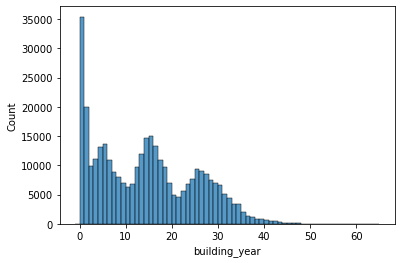

In [99]:
sns.histplot(data = sell, x='building_year', binwidth=1)

In [106]:
building_year = sell['building_year'].value_counts(normalize=True).sort_index().to_frame()
building_year = building_year.reset_index()

In [107]:
building_year

,index,building_year
0,-1,0.000084
1,0,0.102113
2,1,0.057692
3,2,0.028305
4,3,0.031826
5,4,0.037686
6,5,0.039606
7,6,0.031624
8,7,0.025355
9,8,0.023250


In [117]:
building_year['con_1'] = building_year['building_year'].apply(lambda x : 1 if x <= 5 else (2 if x <= 10 else ( 3 if x <= 20 else 4 if x <= 30 else 5)))
building_year['con_2'] = building_year['building_year'].apply(lambda x : 1 if x <= 5 else (2 if x <= 15 else ( 3 if x <= 25 else 4 )))
building_year['con_3'] = building_year['building_year'].apply(lambda x : 1 if x <= 2 else (2 if x <= 10 else ( 3 if x <= 20 else 4 if x <= 30 else 5 )))

In [110]:
building_year.columns = ['building_year','rate','con_1']

In [112]:
building_year.groupby('con_1').agg({'rate' : 'sum'})

,rate
con_1,
1,0.297312
2,0.118879
3,0.299950
4,0.209769
5,0.074091


In [115]:
building_year.groupby('con_2').agg({'rate' : 'sum'})

,rate
con_2,
1,0.297312
2,0.286181
3,0.231324
4,0.185184


In [163]:
building_year.groupby('con_3').agg({'rate' : 'sum'})
# building_year['con_3'] = building_year['building_year'].apply(lambda x : 1 if x <= 2 else (2 if x <= 10 else ( 3 if x <= 20 else 4 if x <= 30 else 5 )))
# 1 : 2년까지
# 2 : 10 이하
# 3 : 20년 이하
# 4 : 30년 이하
# 5 : 30년 초과

,rate
con_3,
1,0.188194
2,0.227996
3,0.299950
4,0.209769
5,0.074091


## 도로명

In [128]:
def get_road(x) :
    con = x.split(' ')[0]
    
    if con[-2:] == '대로' : 
        return 1
    elif con[-1:] == '로' :
        return 2
    else :
        return 3

In [141]:
sell['cityrange'] = sell['doro'].map(get_road)

In [142]:
sell['cityrange'].value_counts()

3    283618
2     55492
1      7681
Name: cityrange, dtype: int64

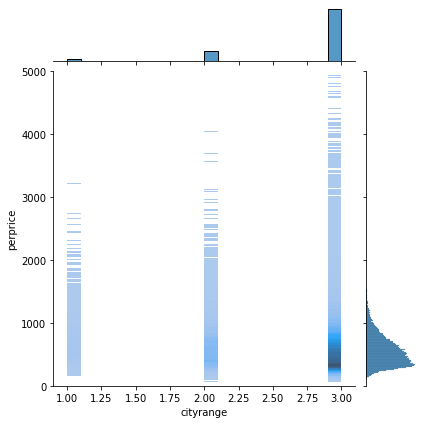

In [156]:
sns.jointplot(data = sell, y='perprice',x='cityrange', kind='hist', ylim=(0,5000) )

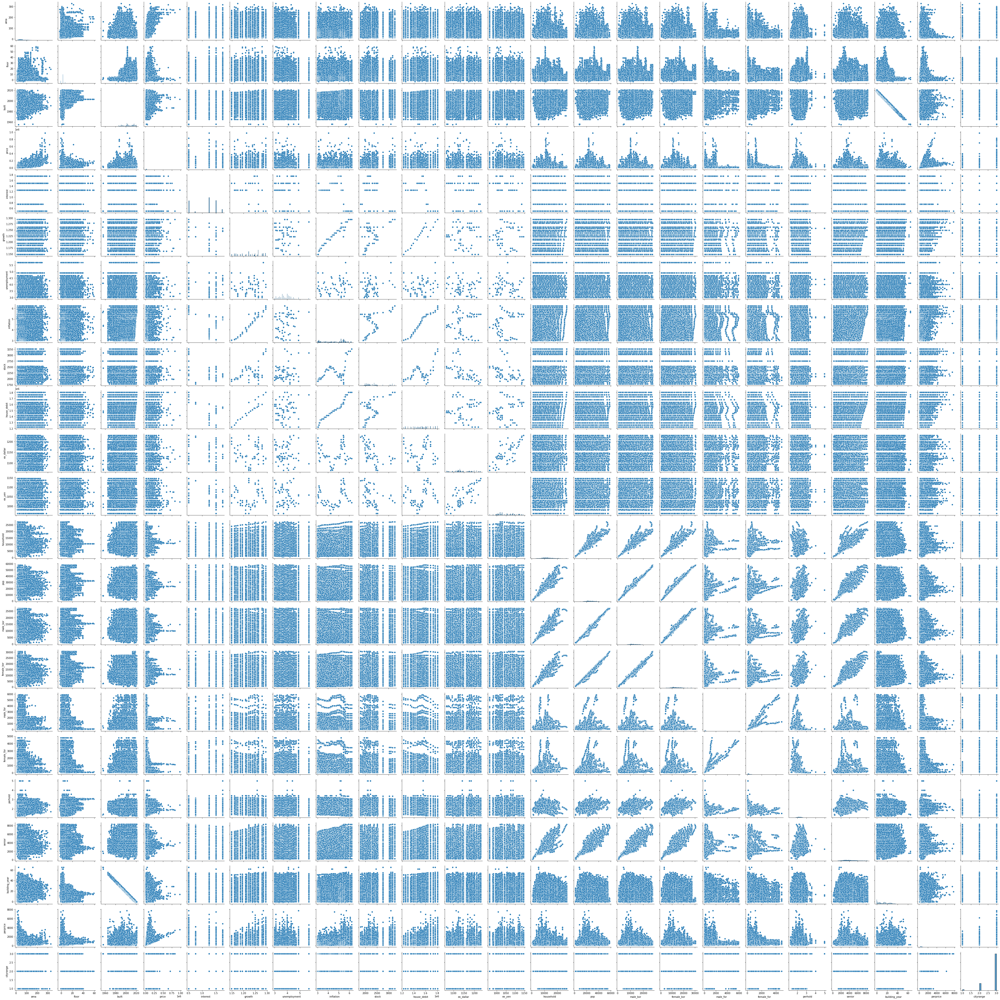

In [157]:
sns.pairplot(sell)

In [323]:
sell.columns

Index(['date', 'gu', 'dong', 'area', 'floor', 'built', 'doro', 'tradetype',
       'price', 'interest', 'growth', 'unemployment', 'inflation', 'stock',
       'house_debit', 'ex_dallar', 'ex_yen', 'household', 'pop', 'male_kor',
       'female_kor', 'male_for', 'female_for', 'perhold', 'senior',
       'building_year', 'perprice', 'cityrange', 'area_level', 'year'],
      dtype='object')

In [330]:
sell['rate_male'] = sell['male_kor'] / sell['pop']
sell['rate_female'] = sell['female_kor'] / sell['pop']
sell['rate_male_f'] = sell['male_for'] / sell['pop']
sell['rate_female_f'] = sell['female_for'] / sell['pop']
sell['rate_senior'] = sell['senior'] / sell['pop']

In [335]:
corr = sell[sell['gu']=='마포구'][['perprice', 'floor',
       'interest', 'growth', 'unemployment', 'inflation', 'stock',
       'house_debit', 'ex_dallar', 'ex_yen', 'household', 'pop', 'rate_male',
       'rate_female', 'rate_male_f', 'rate_female_f', 'perhold', 'rate_senior',
       'building_year']].corr()

<AxesSubplot:>

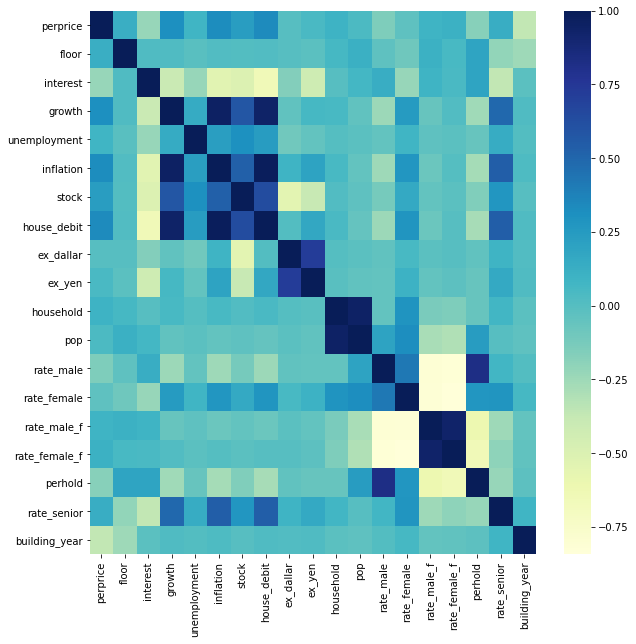

In [336]:
plt.figure(figsize=[10,10])
sns.heatmap(corr, cmap='YlGnBu')

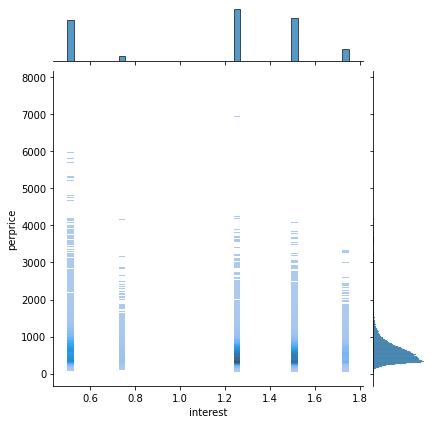

In [339]:
sns.jointplot(data = sell, x = 'interest', y='perprice', kind='hist')

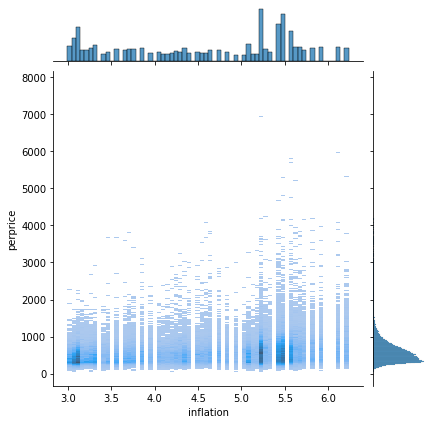

In [341]:
sns.jointplot(data = sell, x = 'inflation', y='perprice', kind='hist')

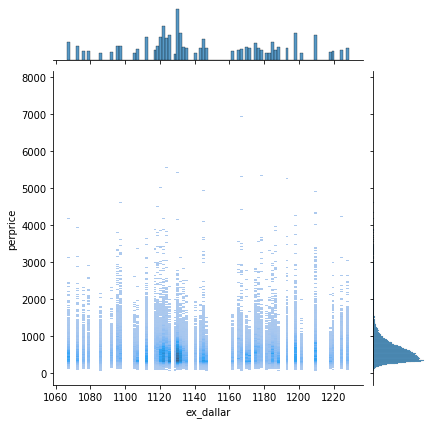

In [344]:
sns.jointplot(data = sell, x = 'ex_dallar', y='perprice', kind='hist')

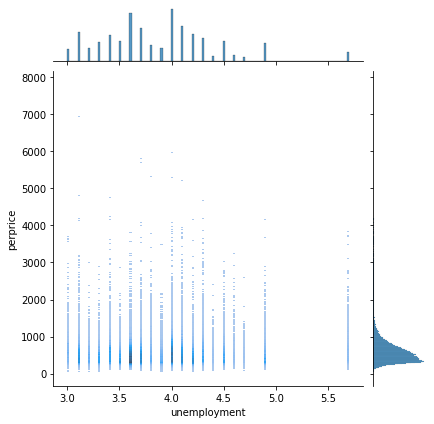

In [346]:
sns.jointplot(data = sell, x = 'unemployment', y='perprice', kind='hist')

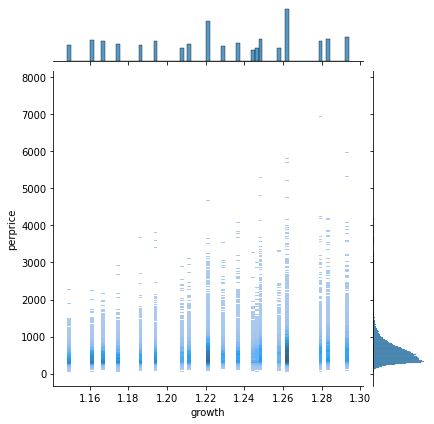

In [348]:
sns.jointplot(data = sell, x = 'growth', y='perprice', kind='hist')

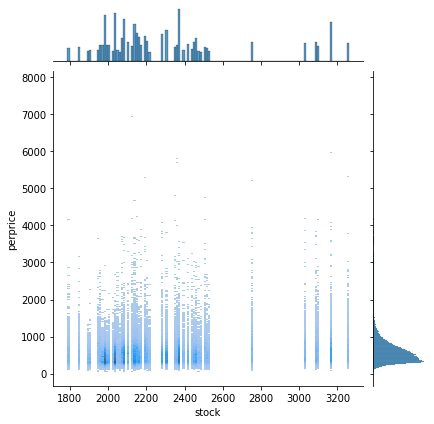

In [349]:
sns.jointplot(data = sell, x = 'stock', y='perprice', kind='hist')

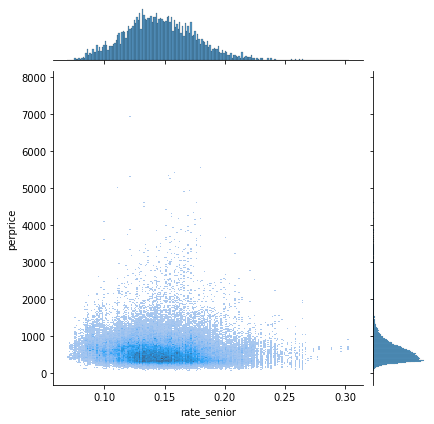

In [350]:
sns.jointplot(data = sell, x = 'rate_senior', y='perprice', kind='hist')

In [347]:
sell.columns

Index(['date', 'gu', 'dong', 'area', 'floor', 'built', 'doro', 'tradetype',
       'price', 'interest', 'growth', 'unemployment', 'inflation', 'stock',
       'house_debit', 'ex_dallar', 'ex_yen', 'household', 'pop', 'male_kor',
       'female_kor', 'male_for', 'female_for', 'perhold', 'senior',
       'building_year', 'perprice', 'cityrange', 'area_level', 'year',
       'rate_male', 'rate_female', 'rate_male_f', 'rate_female_f',
       'rate_senior'],
      dtype='object')

구현 방식에 대한 고민

출력값에 대한 저장
input output db에 저장하는 것도 고민

프론트 >> flask

output 종류
 - 거래금 / 대여금 예측
 - 입력값의 3개월 선의 위치
 - 
 
입력값

위치 : 구 동 / 행정동 찾기 >> 주소를 입력 받아서 kakao api >> 행정동
건축물 : 연립 / 오피스텔
면적 : 제곱미터 / 평 변환?
계약가격 : 전세 / 월세  /// 셀렉박스 >>>
층수 : 
연식 : 

-- 경제 / 인구 데이터는 입력값 맞춰서 가져오기




In [351]:
sell.columns

Index(['date', 'gu', 'dong', 'area', 'floor', 'built', 'doro', 'tradetype',
       'price', 'interest', 'growth', 'unemployment', 'inflation', 'stock',
       'house_debit', 'ex_dallar', 'ex_yen', 'household', 'pop', 'male_kor',
       'female_kor', 'male_for', 'female_for', 'perhold', 'senior',
       'building_year', 'perprice', 'cityrange', 'area_level', 'year',
       'rate_male', 'rate_female', 'rate_male_f', 'rate_female_f',
       'rate_senior'],
      dtype='object')

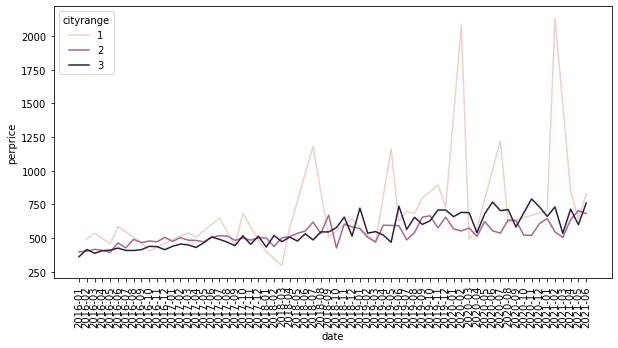

In [365]:
a = sell.groupby(['date','gu','dong','cityrange']).agg({'perprice' : 'mean'})
a = a.reset_index()

plt.figure(figsize =[10,5])
sns.lineplot(data = a[a['gu']=='서대문구'], x='date', y='perprice', hue='cityrange', ci=None)
plt.xticks(rotation = 90)
plt.show()

In [370]:
gu_list[0]

'강남구'

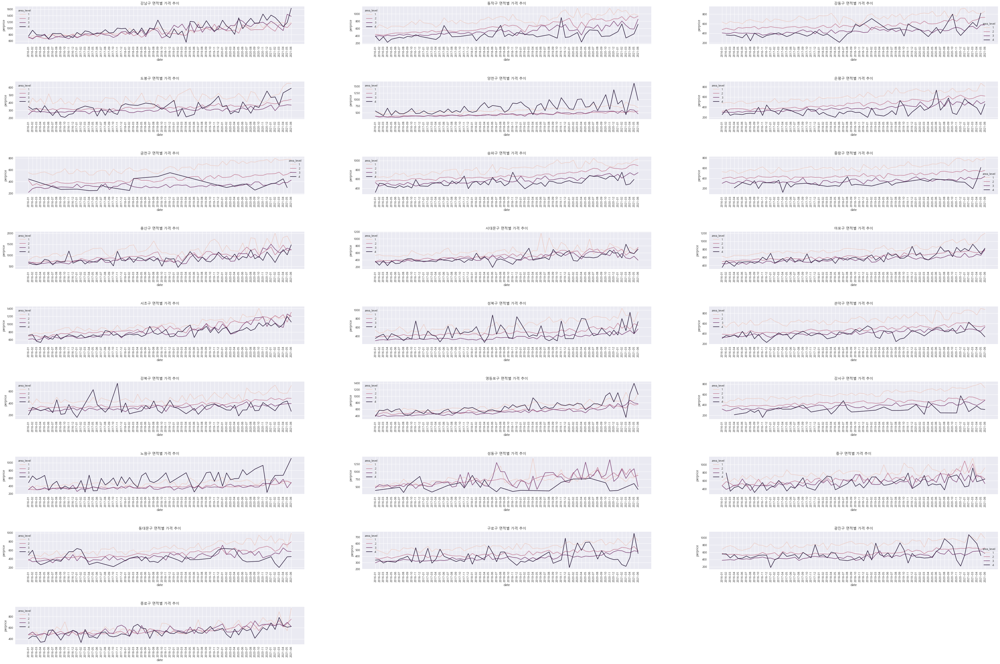

In [377]:
plt.figure(figsize = [60,40])
gu_list = sell['gu'].unique()
a = sell.groupby(['date','gu','dong','area_level']).agg({'perprice' : 'mean'})
a = a.reset_index()

for i in range(len(gu_list)) : 
    plt.subplot(9, 3, (i+1))
    plt.subplots_adjust(hspace= 0.8)
    _ = sns.lineplot(data = a[a['gu']==gu_list[i]], x='date', y='perprice', hue='area_level', ci=None)
    plt.xticks(rotation = 90)
    plt.title(f'{gu_list[i]} 면적별 가격 추이')

plt.show()

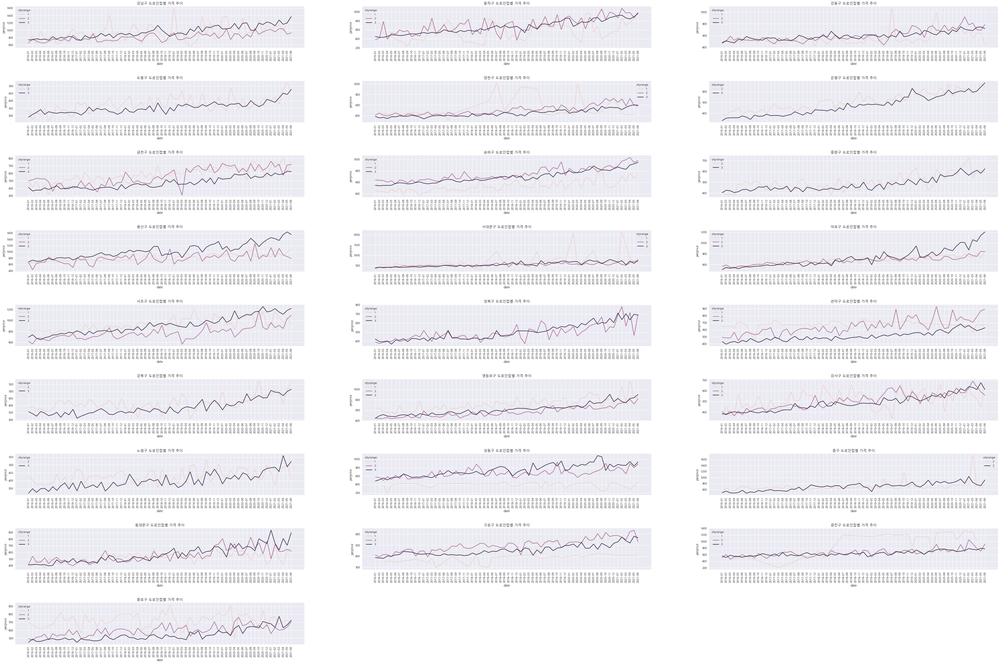

In [378]:
plt.figure(figsize = [60,40])
gu_list = sell['gu'].unique()
a = sell.groupby(['date','gu','dong','cityrange']).agg({'perprice' : 'mean'})
a = a.reset_index()

for i in range(len(gu_list)) : 
    plt.subplot(9, 3, (i+1))
    plt.subplots_adjust(hspace= 0.8)
    _ = sns.lineplot(data = a[a['gu']==gu_list[i]], x='date', y='perprice', hue='cityrange', ci=None)
    plt.xticks(rotation = 90)
    plt.title(f'{gu_list[i]} 도로인접별 가격 추이')

plt.show()

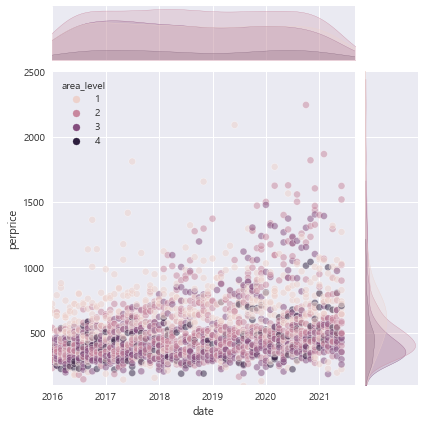

In [435]:
a = sell.groupby(['date','gu','dong','area_level']).agg({'inflation' : 'mean',
                                                        'perprice' : 'mean'})
a = a.reset_index()
a['date'] = a['date'].apply(lambda x: dt.datetime.strptime(x, '%Y-%m'))

df = a[a['gu'] =='서대문구']

sns.jointplot(data = df, x='date', y='perprice', hue='area_level',
                xlim = [dt.datetime(2016,1,1),dt.datetime(2021,9,1)], ylim=[100,2500], alpha = 0.5)
plt.show()

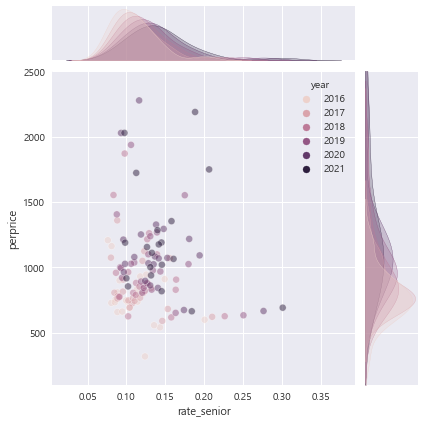

In [444]:
a = sell.groupby(['year','gu','dong']).agg({'rate_senior' : 'mean',
                                            'perprice' : 'mean'})
a = a.reset_index()
# a['year'] = a['year'].apply(lambda x: dt.datetime.strptime(x, '%Y'))

df = a[a['gu'] =='강남구']

sns.jointplot(data = df, x='rate_senior', y='perprice', hue='year',
#                 xlim =[dt.datetime(2016,1,1),dt.datetime(2021,9,1)]
                  ylim=[100,2500], alpha = 0.5)
plt.show()

In [446]:
sell.head()

,date,gu,dong,area,floor,built,doro,tradetype,price,interest,...,building_year,perprice,cityrange,area_level,year,rate_male,rate_female,rate_male_f,rate_female_f,rate_senior
0,2016-01,강남구,논현1동,33.54,13,2003,도산대로 158,4,23700,1.5,...,13,706.618962,1,2,2016,0.451793,0.526689,0.010224,0.011294,0.099346
1,2016-01,강남구,논현1동,64.78,3,1991,봉은사로 129,4,28300,1.5,...,25,436.863229,2,2,2016,0.451793,0.526689,0.010224,0.011294,0.099346
2,2016-01,강남구,개포4동,28.30,-1,1997,개포로15길 30,1,8000,1.5,...,19,282.685512,3,1,2016,0.490065,0.501028,0.003915,0.004992,0.092894
3,2016-01,강남구,논현1동,75.85,2,2001,학동로23길 59,1,48800,1.5,...,15,643.375082,3,3,2016,0.451793,0.526689,0.010224,0.011294,0.099346
4,2016-01,강남구,도곡2동,16.98,5,2012,논현로26길 36-5,1,14000,1.5,...,4,824.499411,3,1,2016,0.464393,0.531635,0.002156,0.001816,0.101458


In [448]:
sell.columns

Index(['date', 'gu', 'dong', 'area', 'floor', 'built', 'doro', 'tradetype',
       'price', 'interest', 'growth', 'unemployment', 'inflation', 'stock',
       'house_debit', 'ex_dallar', 'ex_yen', 'household', 'pop', 'male_kor',
       'female_kor', 'male_for', 'female_for', 'perhold', 'senior',
       'building_year', 'perprice', 'cityrange', 'area_level', 'year',
       'rate_male', 'rate_female', 'rate_male_f', 'rate_female_f',
       'rate_senior'],
      dtype='object')

In [460]:
sell['floor_level'] = sell['floor'].apply(lambda x : 1 if x <0 else (2 if x < 3 else 3))

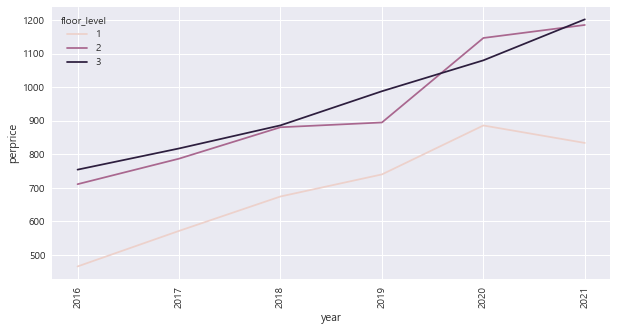

In [589]:
a = sell.groupby(['year','gu','dong','floor_level']).agg({'perprice' : 'mean'})
a = a.reset_index()

plt.figure(figsize =[10,5])
sns.lineplot(data = a[a['gu']=='서초구'], x='year', y='perprice', hue='floor_level', ci=None)
plt.xticks(rotation = 90)
plt.show()

In [620]:
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split

from lightgbm import LGBMRegressor
from sklearn.model_selection import StratifiedKFold

from sklearn.metrics import mean_squared_error

In [612]:
sample = sell[sell['gu']=='관악구']
sample.shape

(16529, 36)

In [753]:
num_col = ['interest', 'growth', 'unemployment', 'inflation', 'stock',
       'house_debit', 'ex_dallar', 'ex_yen','household', 'pop','building_year']
rate_col = ['rate_male', 'rate_female', 'rate_male_f', 'rate_female_f','rate_senior']
cate_col = ['dong','tradetype','cityrange', 'area_level','floor_level']

def get_RMSE(df, re='RMSE') :
    scaler = RobustScaler()

    X_num = scaler.fit_transform(df[num_col])
    X_num = pd.DataFrame(X_num, columns=num_col)

    X_cate = df[cate_col].reset_index(drop=True)
    X_cate = X_cate.astype('category')

    X_rate = df[rate_col].reset_index(drop=True)

    X = pd.concat([X_num,X_cate, X_rate], axis = 1, ignore_index=True)

    y = df['perprice'].reset_index(drop=True)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=910, shuffle=True)

    model = LGBMRegressor(n_estimators = 1000, objective='regression')
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    if re == 'result' : 
        return pd.concat([y_test.to_frame().reset_index(drop=True), pd.DataFrame(y_pred)], axis = 1)
    elif re == 'RMSE' :
        return mean_squared_error(y_test, y_pred)

In [741]:
num_col2 = ['area','interest', 'growth', 'unemployment', 'inflation', 'stock',
       'house_debit', 'ex_dallar', 'ex_yen','household', 'pop','building_year']
rate_col2 = ['rate_male', 'rate_female', 'rate_male_f', 'rate_female_f','rate_senior']
cate_col2 = ['dong','tradetype','cityrange','floor_level']

def get_RMSE2(df, re = 'RMSE') :
    scaler = RobustScaler()

    X_num = scaler.fit_transform(df[num_col2])
    X_num = pd.DataFrame(X_num, columns=num_col2)

    X_cate = df[cate_col2].reset_index(drop=True)
    X_cate = X_cate.astype('category')

    X_rate = df[rate_col2].reset_index(drop=True)

    X = pd.concat([X_num,X_cate, X_rate], axis = 1, ignore_index=True)

    y = df['price'].reset_index(drop=True)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=910, shuffle=True)

    model = LGBMRegressor(n_estimators = 1000, objective='regression')
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    
    if re == 'result' : 
        return pd.concat([y_test.to_frame().reset_index(drop=True), pd.DataFrame(y_pred)], axis = 1)
    elif re == 'RMSE' :
        return mean_squared_error(y_test, y_pred)

In [738]:
quant = sell[sell['gu']=='강남구']['perprice'].quantile(q= .95)
df = sell[(sell['gu'] == '강남구') & (sell['perprice'] < quant)]

scaler = RobustScaler()

X_num = scaler.fit_transform(df[num_col2])
X_num = pd.DataFrame(X_num, columns=num_col2)

X_cate = df[cate_col2].reset_index(drop=True)
X_cate = X_cate.astype('category')

X_rate = df[rate_col2].reset_index(drop=True)

X = pd.concat([X_num,X_cate, X_rate], axis = 1, ignore_index=True)

y = df['price'].reset_index(drop=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=910, shuffle=True)

model = LGBMRegressor(n_estimators = 1000, objective='regression')
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

tb_pred = pd.concat([y_test.to_frame().reset_index(drop=True), pd.DataFrame(y_pred)], axis = 1)
tb_pred.columns = ['price', qu]

In [739]:
tb_pred

,price,0.85
0,8000,"7,825.29"
1,30800,"34,257.54"
2,28660,"28,852.24"
3,50650,"48,665.18"
4,35000,"34,655.53"
...,...,...
3885,19000,"21,240.33"
3886,19750,"19,674.94"
3887,33900,"25,685.03"
3888,16800,"16,452.81"


In [709]:
quant = sell[sell['gu']=='강남구']['perprice'].quantile(q= .95)
df = sell[(sell['gu'] == '강남구') & (sell['perprice'] < quant)]

scaler = RobustScaler()

X_num = scaler.fit_transform(df[num_col])
X_num = pd.DataFrame(X_num, columns=num_col)

X_cate = df[cate_col].reset_index(drop=True)
X_cate = X_cate.astype('category')

X_rate = df[rate_col].reset_index(drop=True)

X = pd.concat([X_num,X_cate, X_rate], axis = 1, ignore_index=True)

y = df['perprice'].reset_index(drop=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=910, shuffle=True)

model = LGBMRegressor(n_estimators = 1000, objective='regression', learning_rate=0.01)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

tb_pred = pd.DataFrame([y_test, y_pred]).T

In [710]:
tb_pred

,perprice,Unnamed 0
6837,401.81,NaN
9653,762.00,NaN
7995,892.56,NaN
4796,694.60,NaN
12636,621.23,NaN
...,...,...
12367,573.15,NaN
5191,748.67,NaN
11042,809.65,NaN
7434,768.18,NaN


In [615]:
X

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,0.178023,-0.911343,-0.319452,-1.130454,-0.637415,-0.872882,0.981579,-0.452196,0.271272,1.374676,...,0.206663,0.303470,-0.447146,-0.528591,-0.010162,미성동,1,3,2,1
1,0.178023,-0.911343,-0.319452,-1.130454,-0.637415,-0.872882,0.981579,-0.452196,0.271272,1.374676,...,0.206663,0.303470,-0.447146,-0.528591,-0.010162,미성동,1,3,3,2
2,0.178023,-0.911343,-0.319452,-1.130454,-0.637415,-0.872882,0.981579,-0.452196,0.271272,1.374676,...,0.206663,0.303470,-0.447146,-0.528591,-0.010162,미성동,1,3,2,3
3,0.178023,-0.911343,-0.319452,-1.130454,-0.637415,-0.872882,0.981579,-0.452196,0.271272,1.374676,...,0.206663,0.303470,-0.447146,-0.528591,-0.010162,미성동,1,3,2,3
4,0.178023,-0.911343,-0.319452,-1.130454,-0.637415,-0.872882,0.981579,-0.452196,0.271272,1.374676,...,0.206663,0.303470,-0.447146,-0.528591,-0.010162,미성동,1,3,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16524,0.178023,0.856571,0.432234,0.821314,-0.237902,0.626657,0.472498,0.319663,2.807358,1.624589,...,-0.880298,0.486700,0.126586,0.395007,-0.716246,청룡동,1,3,3,3
16525,0.178023,0.856571,0.432234,0.821314,-0.237902,0.626657,0.472498,0.319663,2.807358,1.624589,...,-0.880298,0.486700,0.126586,0.395007,-0.716246,청룡동,1,3,1,1
16526,-1.625006,1.595553,0.244313,1.420356,2.473185,1.781334,-0.624888,-0.530096,1.078163,-0.149974,...,3.882242,-4.045485,0.519853,1.152551,-0.769276,대학동,1,3,1,1
16527,-1.625006,1.595553,0.244313,1.420356,2.473185,1.781334,-0.624888,-0.530096,1.078163,-0.149974,...,3.882242,-4.045485,0.519853,1.152551,-0.769276,대학동,1,3,2,3


In [684]:
cols = ['area','interest', 'growth', 'unemployment', 'inflation', 'stock',
       'house_debit', 'ex_dallar', 'ex_yen', 'household', 'pop',
       'building_year','dong', 'tradetype', 'cityrange', 'floor_level',
       'rate_male', 'rate_female', 'rate_male_f', 'rate_female_f',
       'rate_senior']

In [686]:
result = pd.concat([y_test.to_frame().reset_index(drop=True), pd.DataFrame(y_pred).reset_index(drop=True)], axis = 1, ignore_index=True)
result.columns = ['y','pred']
result['reside'] = result['y'] - result['pred']

<AxesSubplot:>

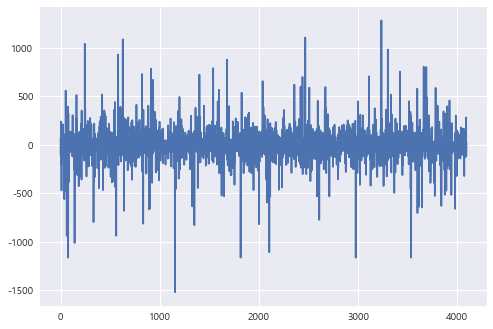

In [687]:
result['reside'].plot()

<AxesSubplot:xlabel='importance', ylabel='feature'>

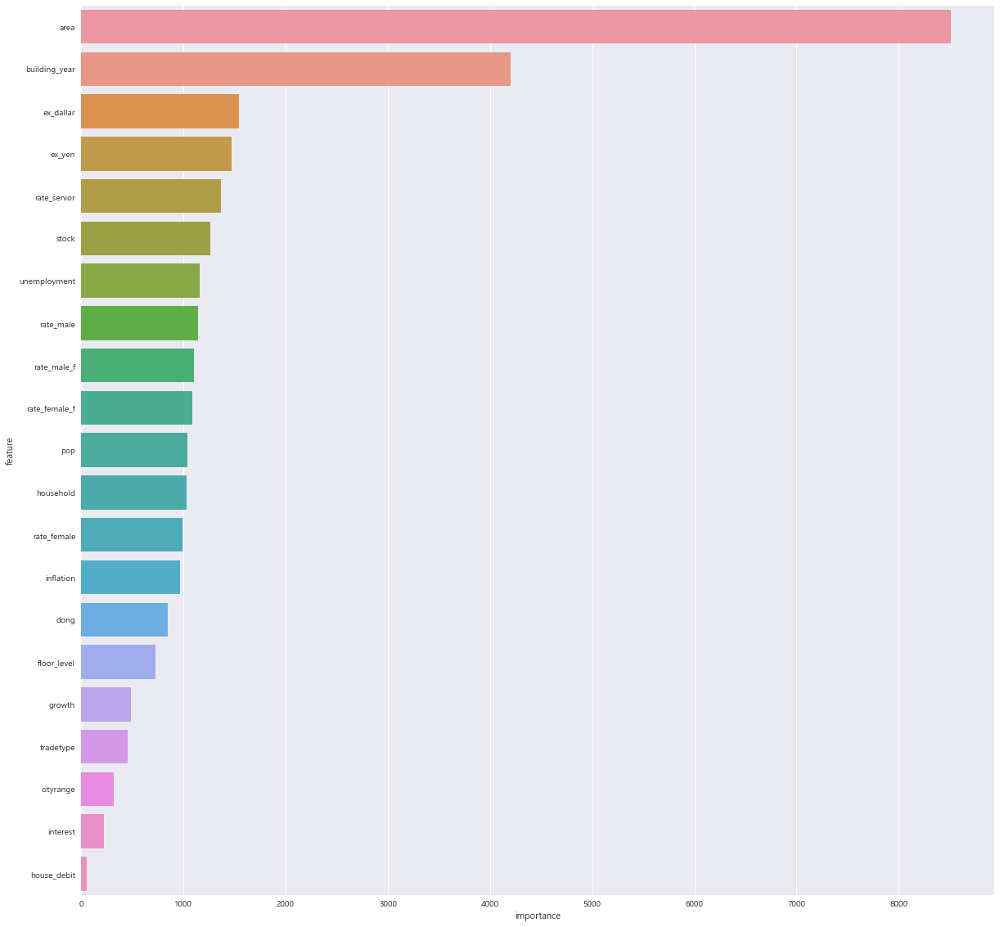

In [744]:
feature_importance = pd.DataFrame([model.feature_importances_, cols], index= ["importance", "feature"]).T
feature_importance = feature_importance.sort_values("importance", ascending = False)
plt.figure(figsize = (20,20))
sns.barplot(data = feature_importance, x = "importance", y = "feature")

<AxesSubplot:xlabel='perprice'>

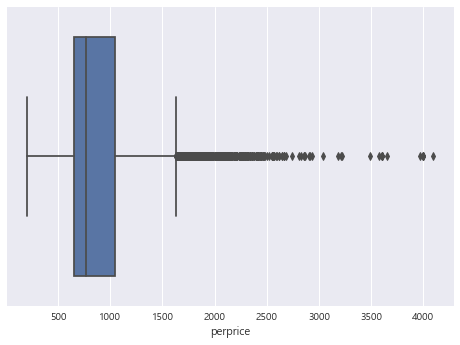

In [643]:
sns.boxplot(data = sell[sell['gu']=='강남구'], x='perprice')

In [657]:
sell[sell['gu']=='강남구']['perprice'].quantile(q=.90)

1383.1900501938353

In [667]:
for qu in [1, .95, .9, .85] : 
    rmse_result = []
    for i in range(len(gu_list)) : 
        quant = sell[sell['gu']==gu_list[i]]['perprice'].quantile(q= qu)
        df = sell[(sell['gu'] == gu_list[i]) & (sell['perprice'] < quant)]
        rmse = get_RMSE(df)

        rmse_result.append([gu_list[i], rmse])

    if qu == 1:
        tb = pd.DataFrame(rmse_result, columns=['gu',qu])
    else : 
        tmp = pd.DataFrame(rmse_result, columns=['gu', qu])
        tb = tb.merge(tmp, on='gu')

In [668]:
tb

,gu,1,0.95,0.9,0.85
0,강남구,20748.295350,10298.407163,9220.191971,7547.979094
1,동작구,26105.357907,10816.307404,8512.979089,7520.813012
2,강동구,7157.391048,4732.753160,4016.463989,3844.768694
3,도봉구,2883.747631,2231.520089,2050.661352,1972.266974
4,양천구,5815.350694,4203.464077,3780.138383,3369.667546
5,은평구,14462.366989,6765.178462,5308.619862,4456.525630
6,금천구,4031.819307,2918.656310,2858.613672,2742.428018
7,송파구,15499.054440,8020.386036,7234.360871,6947.413447
8,중랑구,5034.425650,3756.044877,3426.632098,3210.229463
9,용산구,53080.101277,29561.059030,20964.923036,16782.205939


In [671]:
for qu in [1 , .95 , .9, .85] : 
    rmse_result = []

    for i in range(len(gu_list)) : 
        quant = sell[sell['gu']==gu_list[i]]['perprice'].quantile(q=qu)
        df = sell[(sell['gu'] == gu_list[i]) & (sell['perprice'] < quant)]
        rmse = get_RMSE2(df)

        rmse_result.append([gu_list[i], rmse])
    
    if qu == 1 :
        tb2 = pd.DataFrame(rmse_result, columns=['gu', qu])
    else : 
        tmp = pd.DataFrame(rmse_result, columns=['gu',qu])
        tb2 = tb2.merge(tmp, on='gu')

In [674]:
pd.options.display.float_format = '{:,.2f}'.format

In [675]:
tb2

,gu,1,0.95,0.9,0.85
0,강남구,"116,084,420.09","69,676,609.81","61,134,333.91","47,362,412.87"
1,동작구,"65,014,303.80","32,510,777.63","26,849,463.25","24,270,923.98"
2,강동구,"12,453,540.84","10,235,590.12","10,115,558.62","9,837,948.15"
3,도봉구,"6,550,780.76","5,113,240.59","5,189,676.82","4,988,993.49"
4,양천구,"16,606,725.29","11,736,468.67","11,058,065.08","9,369,385.29"
5,은평구,"28,988,740.45","16,758,644.83","13,772,348.68","12,400,733.40"
6,금천구,"8,309,264.01","6,707,243.56","8,454,258.98","7,562,561.72"
7,송파구,"31,062,255.80","26,634,801.84","21,320,430.29","25,113,724.93"
8,중랑구,"9,773,247.95","8,207,209.15","8,821,176.54","8,050,180.35"
9,용산구,"402,798,895.36","174,938,884.62","117,668,595.92","86,446,317.89"


In [676]:
sell[sell['gu'] == '강남구']['price']

0         23700
1         28300
2          8000
3         48800
4         14000
          ...  
346436    55000
346437    58000
346440    56200
346459    26000
346465    38000
Name: price, Length: 13648, dtype: int64

In [747]:
gu = '양천구'

for qu in [1 , .95 , .9, .85] : 
    rmse_result = []

    quant = sell[sell['gu']==gu]['perprice'].quantile(q=qu)
    df = sell[(sell['gu'] == gu) & (sell['perprice'] < quant)]
    rmse = get_RMSE2(df,'result')

    rmse.columns = ['y',qu]
    
    if qu == 1 :
        result_tb = rmse
    else : 
        result_tb = pd.concat([result_tb,rmse], axis = 1)

In [748]:
result_tb

,y,1,y,0.95,y,0.9,y,0.85
0,27200,"27,956.44","19,500.00","21,878.31","18,500.00","20,216.39","22,200.00","23,409.72"
1,35250,"23,956.63","10,600.00","11,466.00","23,000.00","21,939.68","19,200.00","21,930.49"
2,22260,"25,166.60","19,500.00","20,846.56","16,000.00","18,226.02","14,700.00","14,581.79"
3,11000,"12,506.67","5,300.00","4,952.02","13,500.00","13,432.91","26,200.00","26,221.53"
4,18650,"21,366.05","22,600.00","20,741.72","15,800.00","16,667.78","20,400.00","17,928.28"
...,...,...,...,...,...,...,...,...
5699,22000,"22,865.58",NaN,NaN,NaN,NaN,NaN,NaN
5700,15000,"11,533.04",NaN,NaN,NaN,NaN,NaN,NaN
5701,20500,"22,173.24",NaN,NaN,NaN,NaN,NaN,NaN
5702,70000,"70,926.48",NaN,NaN,NaN,NaN,NaN,NaN


In [754]:
gu = '양천구'

for qu in [1 , .95 , .9, .85] : 
    rmse_result = []

    quant = sell[sell['gu']==gu]['perprice'].quantile(q=qu)
    df = sell[(sell['gu'] == gu) & (sell['perprice'] < quant)]
    rmse = get_RMSE(df,'result')

    rmse.columns = ['y',qu]
    
    if qu == 1 :
        result_tb = rmse
    else : 
        result_tb = pd.concat([result_tb,rmse], axis = 1)

In [755]:
result_tb

,y,1,y,0.95,y,0.9,y,0.85
0,694.76,694.52,669.87,878.34,358.25,385.28,424.56,437.66
1,471.95,409.25,241.84,274.82,501.85,481.81,575.19,575.85
2,771.31,894.39,367.96,409.47,533.51,643.17,491.64,527.80
3,294.20,306.10,302.86,303.18,459.18,498.88,476.36,453.54
4,313.60,350.04,398.17,348.51,335.53,362.21,689.42,661.94
...,...,...,...,...,...,...,...,...
5699,355.99,360.16,NaN,NaN,NaN,NaN,NaN,NaN
5700,308.64,296.28,NaN,NaN,NaN,NaN,NaN,NaN
5701,475.97,551.52,NaN,NaN,NaN,NaN,NaN,NaN
5702,619.47,739.35,NaN,NaN,NaN,NaN,NaN,NaN
